In [7]:
import argparse
import os
import time
import warnings

import numpy as np
from matplotlib import pyplot as plt
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.distributed as dist
import torch.optim
import torch.multiprocessing as mp
import torch.utils.data
import torch.utils.data.distributed
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models

from sklearn.cluster import KMeans

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [2]:
class SWAV(nn.Module):
    def __init__(self, model, n_out):
        super(SWAV, self).__init__()
        self.n_out = n_out
        #model = models.convnext_tiny(weights = models.ConvNeXt_Tiny_Weights.IMAGENET1K_V1)
        #model = torch.nn.DataParallel(model)
        self.model = model
        self.prototypes = nn.Linear(1000, n_out, bias = False)
    
    def distributed_sinkhorn(self, out):
        Q = torch.exp(out / 0.05).t() # Q is K-by-B for consistency with notations from our paper
        B = Q.shape[1] # number of samples to assign
        K = Q.shape[0] # how many prototypes

        # make the matrix sums to 1
        sum_Q = torch.sum(Q)
        #dist.all_reduce(sum_Q)
        Q /= sum_Q

        for it in range(3):
            # normalize each row: total weight per prototype must be 1/K
            sum_of_rows = torch.sum(Q, dim=1, keepdim=True)
            #dist.all_reduce(sum_of_rows)
            Q /= sum_of_rows
            Q /= K

            # normalize each column: total weight per sample must be 1/B
            Q /= torch.sum(Q, dim=0, keepdim=True)
            Q /= B

        Q *= B # the colomns must sum to 1 so that Q is an assignment
        return Q.t()
    
    def forward(self, x):
        return self.prototypes(self.model(x))

In [19]:
swav = SWAV(20)
loss = torch.nn.MSELoss()(swav(torch.randn(5, 3, 256, 256)), torch.randn(5, 20))
loss.backward()

In [2]:
#checkpoint = torch.load('/scratch/pl2285/mengye/baby-vision/experiments/resnet50_64_True_SAY_5_288_02122023_195500/epoch_49.tar', map_location=torch.device('cpu'))
model = models.resnext50_32x4d(pretrained=True)
model.fc = torch.nn.Linear(in_features=2048, out_features=1718, bias=True)
model = torch.nn.DataParallel(model).to(device)

checkpoint = torch.load('TC-Y-resnext.tar', map_location = 'cpu')
model.load_state_dict(checkpoint['model_state_dict'])
model.module.fc = nn.Identity()

/ext3/miniconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/ext3/miniconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt50_32X4D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt50_32X4D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [3]:
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
train_dataset = datasets.ImageFolder(
            './val-data',
            transforms.Compose([
                        #transforms.RandomResizedCrop(224, scale=(0.2, 1.)),
                        #transforms.RandomApply([transforms.ColorJitter(0.9, 0.9, 0.9, 0.5)], p=0.9),
                        #transforms.RandomGrayscale(p=0.2),
                        #transforms.RandomApply([GaussianBlur([.1, 2.])], p=0.5),
                        #transforms.RandomHorizontalFlip(),
                        transforms.ToTensor(),
                        normalize
                        ])
        )

In [13]:
def distributed_sinkhorn(out):
    Q = torch.exp(out / 0.05).t() # Q is K-by-B for consistency with notations from our paper
    B = Q.shape[1] # number of samples to assign
    K = Q.shape[0] # how many prototypes

    # make the matrix sums to 1
    sum_Q = torch.sum(Q)
    #dist.all_reduce(sum_Q)
    Q /= sum_Q

    for it in range(3):
        # normalize each row: total weight per prototype must be 1/K
        sum_of_rows = torch.sum(Q, dim=1, keepdim=True)
        #dist.all_reduce(sum_of_rows)
        Q /= sum_of_rows
        Q /= K

        # normalize each column: total weight per sample must be 1/B
        Q /= torch.sum(Q, dim=0, keepdim=True)
        Q /= B

    Q *= B # the colomns must sum to 1 so that Q is an assignment
    return Q.t()

z = torch.randn(18000, 1000)
#z = z / torch.norm(z, dim = 0)
c = z @ torch.randn(1000, 6000)
print(c)
Q = distributed_sinkhorn(c / torch.norm(c, dim = 0))
print(Q)
Q[torch.argmax(Q, dim = 1)]

tensor([[ 17.7015,  -3.3182,  -9.1926,  ..., -18.7775, -37.4506, -10.6714],
        [-39.7390, -34.7908, -25.8596,  ...,  -8.4595, -31.3215,  13.7552],
        [-34.8101,  -0.5111,  26.2090,  ..., -32.5173, -11.6619,   4.7226],
        ...,
        [  0.9666,  15.7694,   9.3378,  ...,  24.9162,   5.7112,   7.9987],
        [  5.9805,  58.0693,  35.2435,  ..., -10.7939,  30.4052, -22.9653],
        [ -8.3362,  55.3717,  -8.2748,  ..., -27.1073, -21.0888,   9.8263]])
tensor([[0.0002, 0.0002, 0.0002,  ..., 0.0001, 0.0001, 0.0002],
        [0.0001, 0.0001, 0.0001,  ..., 0.0002, 0.0001, 0.0002],
        [0.0001, 0.0002, 0.0002,  ..., 0.0001, 0.0002, 0.0002],
        ...,
        [0.0002, 0.0002, 0.0002,  ..., 0.0002, 0.0002, 0.0002],
        [0.0002, 0.0002, 0.0002,  ..., 0.0002, 0.0002, 0.0001],
        [0.0002, 0.0002, 0.0002,  ..., 0.0001, 0.0001, 0.0002]])


tensor([[0.0002, 0.0002, 0.0001,  ..., 0.0001, 0.0001, 0.0001],
        [0.0002, 0.0002, 0.0002,  ..., 0.0001, 0.0002, 0.0002],
        [0.0002, 0.0002, 0.0002,  ..., 0.0002, 0.0002, 0.0002],
        ...,
        [0.0001, 0.0001, 0.0001,  ..., 0.0002, 0.0002, 0.0001],
        [0.0001, 0.0002, 0.0002,  ..., 0.0002, 0.0002, 0.0002],
        [0.0001, 0.0002, 0.0002,  ..., 0.0002, 0.0001, 0.0002]])

In [6]:
indices = torch.tensor(train_dataset.targets)[..., None] == -1
for i in range(1 * 4, 2 * 4):
    indices = torch.logical_or(torch.tensor(train_dataset.targets)[..., None] == i, indices)
indices = (indices).any(-1).nonzero(as_tuple=True)[0]
data = torch.utils.data.Subset(train_dataset, indices)

In [8]:
#checkpoint = torch.load('./baby-vision/experiments/resnet50_64_True_SAY_5_288_02122023_195500/epoch_48.tar'
#                        , map_location = 'cpu')
checkpoint = torch.load('./baby-vision/experiments/convnext_tiny_64_True_SAY_5_288_03232023_062727/epoch_49.tar'
                        , map_location = 'cpu')
#model = models.resnet50(pretrained=True)
model = models.convnext_tiny(weights = models.ConvNeXt_Tiny_Weights.IMAGENET1K_V1)
model = SWAV(torch.nn.DataParallel(model), 1000)
model.load_state_dict(checkpoint['model_state_dict'])
#model = torch.nn.DataParallel(model)

#model.module.fc = nn.Identity()
model.eval()
rep = []
for idx, (example, label) in enumerate(train_dataset):
    if (idx + 1) % 40 == 0:
        print(idx, label)
    else:
        continue
    with torch.no_grad():
        example = model(example.to(device).unsqueeze(0))[0].cpu().detach().numpy()
    example = example / np.linalg.norm(example)
    #one_hot = np.zeros(12)
    #one_hot[label] = 1
    #example = np.concatenate((example, one_hot))
    rep.append(example)

rep = torch.FloatTensor(rep)
#rep = model.distributed_sinkhorn(rep)

39 0
79 0
119 0
159 0
199 0
239 0
279 0
319 0
359 0
399 0
439 0
479 0
519 0
559 0
599 0
639 0
679 0
719 0
759 0
799 0
839 0
879 0
919 0
959 0
999 0
1039 0
1079 0
1119 0
1159 0
1199 0
1239 0
1279 0
1319 0
1359 0
1399 0
1439 0
1479 1
1519 1
1559 1
1599 1
1639 1
1679 1
1719 1
1759 1
1799 1
1839 1
1879 1
1919 1
1959 1
1999 1
2039 1
2079 1
2119 1
2159 1
2199 1
2239 1
2279 1
2319 1
2359 1
2399 1
2439 1
2479 1
2519 1
2559 1
2599 1
2639 1
2679 1
2719 1
2759 1
2799 1
2839 1
2879 1
2919 2
2959 2
2999 2
3039 2
3079 2
3119 2
3159 2
3199 2
3239 2
3279 2
3319 2
3359 2
3399 2
3439 2
3479 2
3519 2
3559 2
3599 2
3639 2
3679 2
3719 2
3759 2
3799 2
3839 2
3879 2
3919 2
3959 2
3999 2
4039 2
4079 2
4119 2
4159 2
4199 2
4239 2
4279 2
4319 2
4359 3
4399 3
4439 3
4479 3
4519 3
4559 3
4599 3
4639 3
4679 3
4719 3
4759 3
4799 3
4839 3
4879 3
4919 3
4959 3
4999 3
5039 3
5079 3
5119 3
5159 3
5199 3
5239 3
5279 3
5319 3
5359 3
5399 3
5439 3
5479 3
5519 3
5559 3
5599 3
5639 3
5679 3
5719 3
5759 3
5799 4
5839 4
5879 

In [13]:
def distributed_sinkhorn(out):
    Q = torch.exp(out / 0.05).t() # Q is K-by-B for consistency with notations from our paper
    B = Q.shape[1] # number of samples to assign
    K = Q.shape[0] # how many prototypes

    # make the matrix sums to 1
    sum_Q = torch.sum(Q)
    #dist.all_reduce(sum_Q)
    Q /= sum_Q

    for it in range(3):
        # normalize each row: total weight per prototype must be 1/K
        sum_of_rows = torch.sum(Q, dim=1, keepdim=True)
        #dist.all_reduce(sum_of_rows)
        Q /= sum_of_rows
        Q /= K

        # normalize each column: total weight per sample must be 1/B
        Q /= torch.sum(Q, dim=0, keepdim=True)
        Q /= B

    Q *= B # the colomns must sum to 1 so that Q is an assignment
    return Q.t()

Q = distributed_sinkhorn(z @ c)

In [7]:
rep = np.array(rep)
kmeans = KMeans(n_clusters=16, random_state=0).fit(rep)
kmeans.labels_

array([13,  6, 11, 14,  9,  9, 13, 13, 12, 13,  2, 12, 14,  2,  4, 13,  2,
       12, 12,  2,  4,  7, 15,  7,  1, 15,  4, 12,  1, 12, 12,  1,  7,  7,
        1,  4,  4,  4,  1,  1,  7,  7,  1, 15, 14, 14,  1,  7, 12, 12,  1,
        7,  7,  1,  3,  7,  7,  7, 15, 15,  4,  4,  4, 15,  7, 12, 15, 15,
       12,  1,  4,  7,  4,  3,  7, 15,  1,  7,  1, 15, 15, 15,  4, 15,  7,
        1, 15,  4, 12, 14, 15,  7, 14,  7, 12,  4,  7,  7, 15, 15, 15,  1,
        7, 15,  7,  7, 15, 15, 10, 10, 15, 15,  9,  7, 15, 10, 10, 15, 15,
        7,  4,  7, 15,  0, 14,  9,  4,  4, 13,  9,  4,  4,  1,  7,  1, 15,
        6,  9, 15,  9, 15,  1,  1,  4,  1,  0,  0,  4,  0,  4,  4,  4, 15,
        4, 15,  1, 15,  4,  4,  9, 12, 15, 15,  4,  0, 10, 15, 15,  1, 15,
        2, 15,  1,  8,  4,  9,  1,  1,  1,  1,  1,  1,  9,  1, 15,  9,  1,
        9,  4,  4,  4, 11,  6,  7, 11,  4, 11, 11,  4,  9, 11, 11,  9,  9,
        1,  1, 13,  6, 11, 11, 11, 11, 11, 11, 11,  9,  0, 15, 12,  3,  3,
       11,  3, 11, 11,  9

In [11]:
Q = model.distributed_sinkhorn(rep)
#Q = rep
print(Q.shape)
A = torch.argmax(Q, dim = 1)
A[torch.where(torch.argmax(Q, dim = 1) > 8)] = 8

torch.Size([259, 1000])


<BarContainer object of 259 artists>

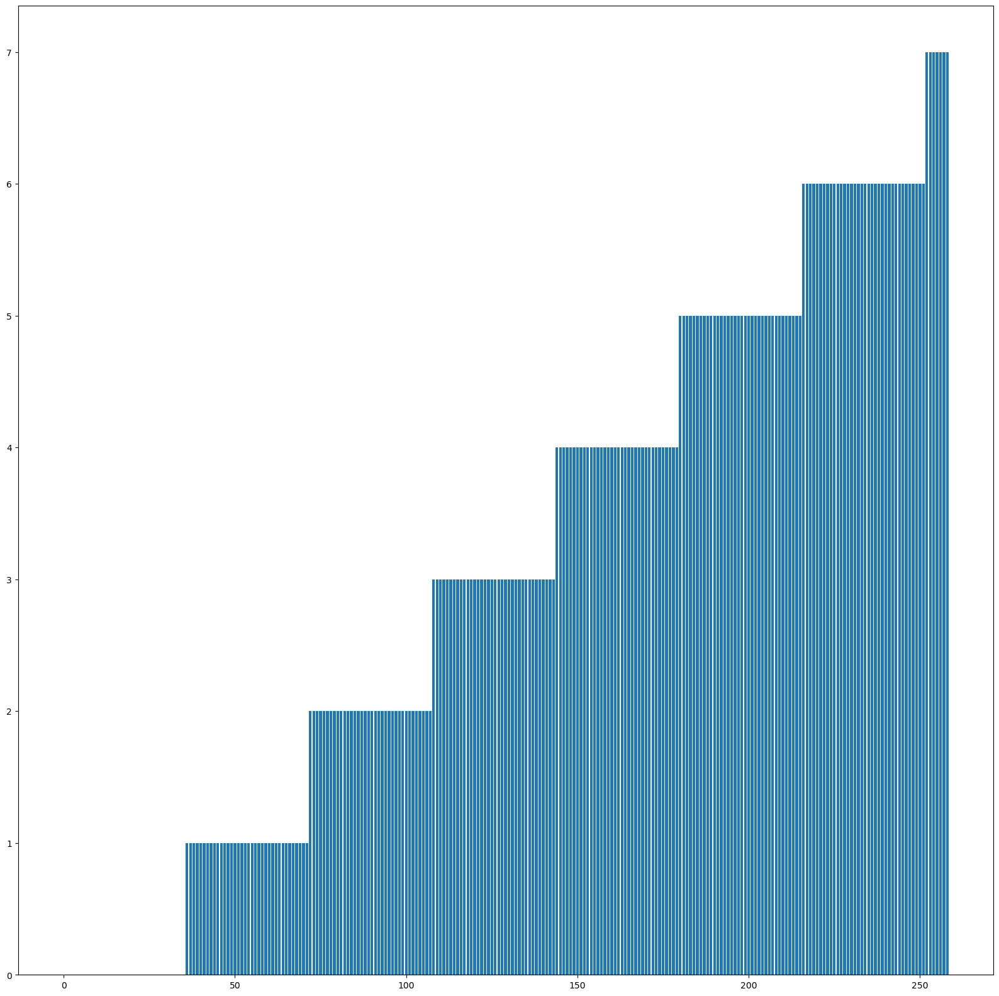

In [13]:
plt.figure(figsize = (20, 20))
#Q = rep
A = torch.argmax(Q, dim = 1)
A[torch.where(torch.argmax(Q, dim = 1) > 8)] = 8
plt.bar(range(len(rep)), A)

<BarContainer object of 259 artists>

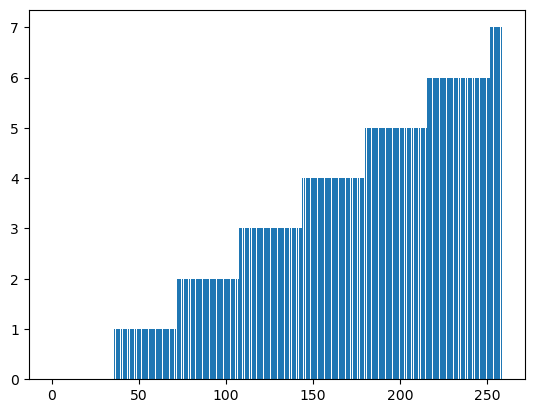

In [7]:
labels = []
for idx, (example, label) in enumerate(train_dataset):
    if (idx + 1) % 40 == 0:
        labels.append(label)
plt.bar(range(len(rep)), labels)

In [21]:
centers = kmeans.cluster_centers_

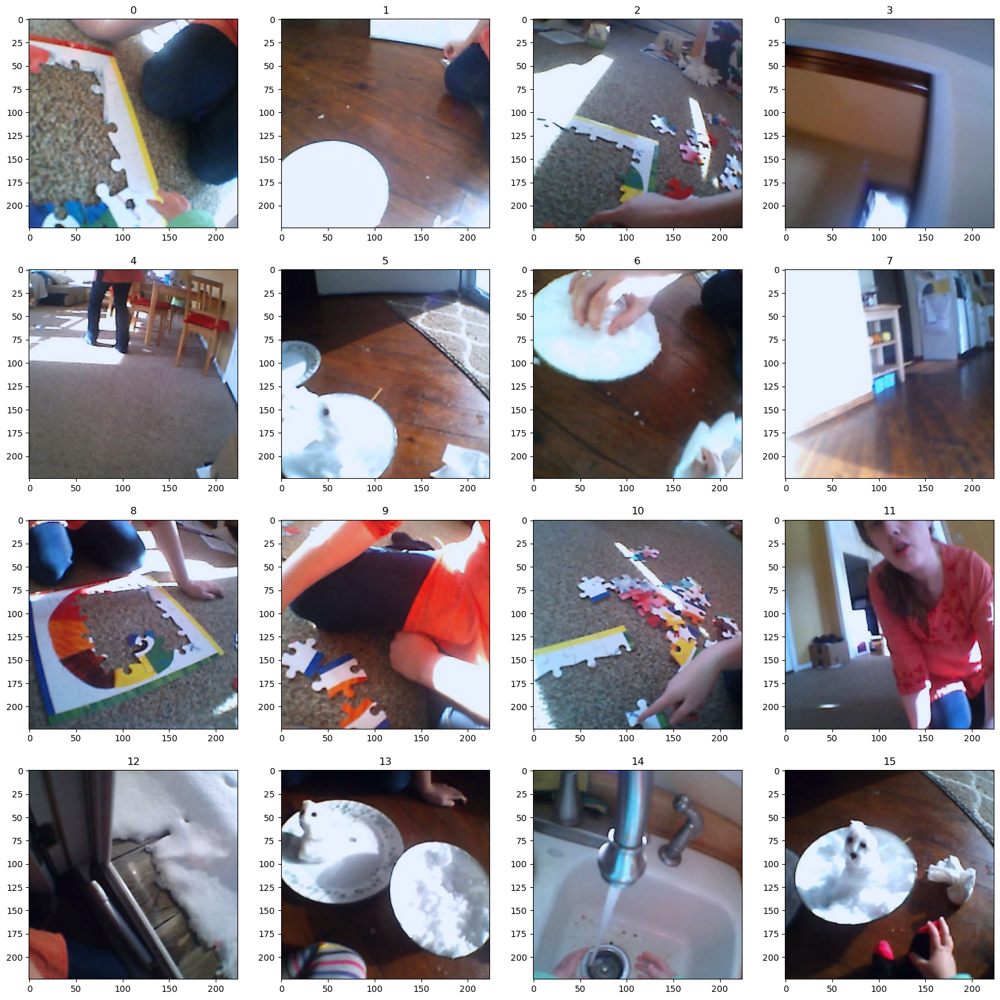

In [22]:
fig2 = plt.figure(figsize = (20, 20))
for idx in range(16):
    ax = fig2.add_subplot(4, 4, idx + 1)
    dis0 = np.linalg.norm(rep - centers[idx], axis = 1)
    img, _= train_dataset[np.argmin(dis0)]
    img = torch.transpose(img, 0, 1) 
    img = torch.transpose(img, 1, 2) 
    img = img.detach().numpy()
    img = (img - np.min(img)) / (np.max(img) - np.min(img))
    ax.set_title(idx)
    ax.imshow(img)
#rep.shape, centers[0].shape, (rep - centers[0]).shape, np.linalg.norm(rep - centers[0], axis = 1).shape

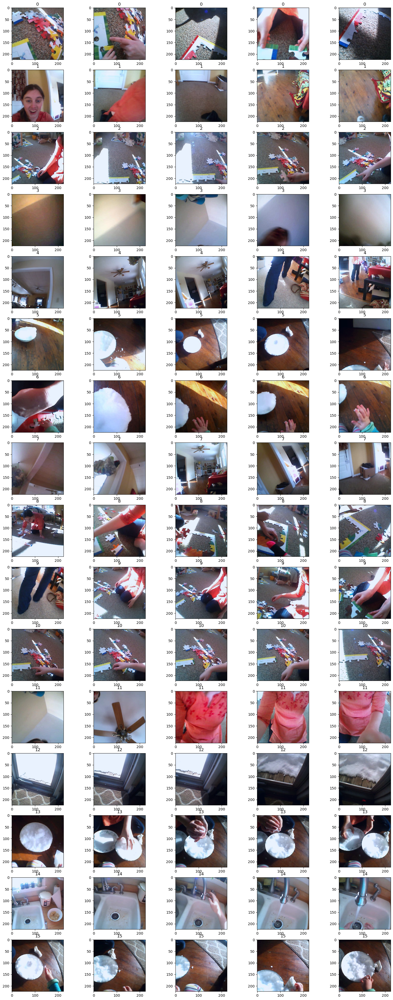

In [23]:
fig2 = plt.figure(figsize = (20, 50))
for idx in range(16):
    for i in range(5):
        ax = fig2.add_subplot(16, 5, idx * 5 + i + 1)
        dis0 = np.where(kmeans.labels_ == idx)[0]
        img, _= train_dataset[dis0[i * 4]]
        img = torch.transpose(img, 0, 1) 
        img = torch.transpose(img, 1, 2) 
        img = img.detach().numpy()
        img = (img - np.min(img)) / (np.max(img) - np.min(img))
        ax.set_title(idx)
        ax.imshow(img)